In [25]:
%load_ext autoreload
%matplotlib ipympl
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sys
import clipboard
import numpy as np
from IPython.display import clear_output
from PIL import Image
import networkx as nx
import json
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import random
import torch
from collections import defaultdict
from torchvision import transforms
import torch.nn.functional as F
import os
from sklearn.metrics.pairwise import cosine_similarity

import time
sys.path.append('/Users/orenm/BlenderShaderProject/project_files/')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
from Logic.data_loaders import create_dataloaders, evaluate_model_by_attribute, SiameseDataset
from Logic.NN_makers import make_siamese_resnet, make_siamese_vgg
from Logic.utils import show_image_grid
from Logic.nn_models_utils import get_image_embedding, count_parameters

# testing result and runtime

In [5]:
def show_example(results, images_path, sample_type="random", pair_type=None, top_to_select=100):
    """
    Displays image pairs along with their similarity scores and labels.

    Args:
        results (list of dict): List containing cosine_sim, error, label, attributes, images.
        images_path (str): Path where images are stored.
        sample_type (str): "random" or "worst" (to show highest error cases).
        num_samples (int): Number of examples to show.
    """
    if pair_type is not None:
        results = [r for r in results if r['attributes'] == pair_type]
    # Select samples
    if sample_type == "random":
        sample = random.sample(results, 1)[0]
    elif sample_type == "worst":
        sorted_worse = sorted(results, key=lambda x: x["error"], reverse=True)[:top_to_select]
        sample = random.sample(sorted_worse, 1)[0]
    else:
        raise ValueError("sample_type must be 'random' or 'worst'")

    img1_path = os.path.join(images_path, f"{sample['images'][0]}.png")
    img2_path = os.path.join(images_path, f"{sample['images'][1]}.png")

    # Load images
    img1 = Image.open(img1_path).convert("L")
    img2 = Image.open(img2_path).convert("L")

    # Display images side by side
    fig, ax = plt.subplots(1, 2, figsize=(8, 4))
    ax[0].imshow(img1, cmap="gray")
    ax[0].axis("off")
    ax[0].set_title("Image 1")

    ax[1].imshow(img2, cmap="gray")
    ax[1].axis("off")
    ax[1].set_title("Image 2")

    # Print similarity and attributes
    print(f"Cosine Similarity: {sample['cosine_sim']:.4f}")
    print(f"Error: {sample['error']:.4f}")
    print(f"Label: {sample['label']}")
    print(f"Attributes: {sample['attributes']}")
    print(f"Images: {sample['images']}")
    print("=" * 50)  # Separator for clarity

In [6]:
path = '/Users/orenm/BlenderShaderProject/data/'
images_path = os.path.join(path, 'images/')
models_path = os.path.join(path, 'models/')
db_path = os.path.join(path, 'DB/')

In [7]:
file_path = os.path.join(path, 'texture_cls_pairs.json')
with open(file_path, "rb") as json_file:
    data = json.load(json_file)

In [8]:
def add_labels(pairs, *labels):
    return [(x[0], x[1], *labels) for x in pairs]

dataset = []
for pair_type in ['different_pairs_random', 'different_pairs_cluster', 'cat_numeric_pairs', 'important_params_pairs']:
    dataset.extend(add_labels(data[pair_type], 0, pair_type))

dataset.extend(add_labels(data['similar_pairs'], 1, 'similar_pairs'))

In [9]:
model_file_paths = [
    '/Users/orenm/BlenderShaderProject/data/models/ep_4_la_17_256_le_0_0001_mo_vgg_fi_64_po_max_lo_cos_re_True.pt',
    '/Users/orenm/BlenderShaderProject/data/models/ep_4_la_6_128_le_0_0001_mo_resnet_fi_128_po_max_lo_cos_re_True.pt',
    '/Users/orenm/BlenderShaderProject/data/models/ep_4_la_6_128_le_0_0001_mo_resnet_fi_64_po_max_lo_cos_re_True.pt',
    '/Users/orenm/BlenderShaderProject/data/models/ep_4_la_7_256_le_0_0001_mo_resnet_fi_128_po_max_lo_cos_re_True.pt'
]

In [19]:
test_sample = random.sample(dataset, 10000)
test_dataset = SiameseDataset(test_sample, images_path, with_names=True)
test_loader = DataLoader(
    test_dataset,
    batch_size=256,
    shuffle=False,
    num_workers=4,
)

In [10]:
model_filepath = model_file_paths[3]
model_filepath

'/Users/orenm/BlenderShaderProject/data/models/ep_4_la_7_256_le_0_0001_mo_resnet_fi_128_po_max_lo_cos_re_True.pt'

In [11]:
# model = make_siamese_vgg(layers_to_take_and_size=(17, 256), final_emb=64, use_avg_pool=False)
# model = make_siamese_resnet(layers_to_take_and_size=(6, 128), final_emb=128, use_avg_pool=False)
# model = make_siamese_resnet(layers_to_take_and_size=(6, 128), final_emb=64, use_avg_pool=False)
model = make_siamese_resnet(layers_to_take_and_size=(7, 256), final_emb=128, use_avg_pool=False)

In [12]:
checkpoint = torch.load(model_filepath, map_location=torch.device("cuda" if torch.cuda.is_available() else "cpu"))

C:\Users\orenm\AppData\Local\Temp\ipykernel_38808\1396205480.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_filepath, map_location=torch.d

In [13]:
torch.cuda.empty_cache()

In [14]:
model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

Sequential(
  (0): Sequential(
    (0): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

In [15]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [16]:
model = model.to(device)

In [17]:
count_parameters(model)

2875200

In [60]:
# criterion = torch.nn.CosineEmbeddingLoss(margin=0.3)
# evaluation = evaluate_model_by_attribute(model, test_loader, criterion)
# evaluation

In [61]:
results = []
t = time.time()
with torch.no_grad():
    for batch_idx, (img1, img2, labels, attributes, names) in enumerate(test_loader, start=1):
        img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
        emb_t = time.time()
        embedding1 = model(img1)
        if batch_idx % 20 == 0:
            print(f'{batch_idx}/{len(test_loader)}')
            print(f'emb time: {time.time() - emb_t}')
        embedding2 = model(img2)

                # Compute cosine similarity
        cosine_sim = F.cosine_similarity(embedding1, embedding2).cpu().numpy()

        # Compute absolute error from label (0 or 1)
        errors = abs(cosine_sim - labels.cpu().numpy())

        # Store results
        for i in range(len(labels)):
            results.append({
                "cosine_sim": cosine_sim[i],
                "error": errors[i],
                "label": labels[i].item(),
                "attributes": attributes[i],
                'images': (names[0][i], names[1][i]),
            })

        if batch_idx % 20 == 0:
            allocated = torch.cuda.memory_allocated() / 1024**2  # In MB
            cached = torch.cuda.memory_reserved() / 1024**2  # In MB
            print(f"GPU Memory Cached: {cached:.2f} MB, GPU Memory Allocated: {allocated:.2f} MB")

print(time.time() - t)

20/40
emb time: 0.0
GPU Memory Cached: 1782.00 MB, GPU Memory Allocated: 165.91 MB
40/40
emb time: 0.015811920166015625
GPU Memory Cached: 1782.00 MB, GPU Memory Allocated: 71.80 MB
40.935935974121094


In [62]:
%%timeit
embedding1 = model(img1)

7.47 ms ± 107 μs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [63]:
# ['different_pairs_random', 'different_pairs_cluster', 'cat_numeric_pairs', 'important_params_pairs', 'similar_pairs']

Cosine Similarity: 0.0152
Error: 1.0152
Label: 0.0
Attributes: cat_numeric_pairs
Images: ('65167', '26277')


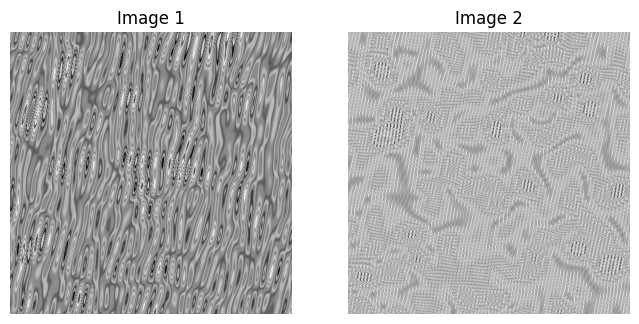

In [361]:
show_example(results, images_path, sample_type='random', top_to_select=100, pair_type='cat_numeric_pairs')

In [337]:
res_by_type = defaultdict(list)
for r in results:
    res_by_type[r['attributes']].append(r['cosine_sim'])

In [340]:
{key: (np.mean(vals), np.std(vals)) for key, vals in res_by_type.items()}

{'different_pairs_cluster': (0.13847585, 0.33824673),
 'similar_pairs': (0.9105371, 0.13405572),
 'important_params_pairs': (0.27351844, 0.41095436),
 'cat_numeric_pairs': (0.37140152, 0.43145445),
 'different_pairs_random': (0.01099859, 0.22104883)}

In [ ]:
# model name, emb time, total time, cache vram, allocated, param count
['vgg_64', 0.005, 70, 9558, 135, 1816576, 38.3 ms]
['resnet_6_128', 0.002, 41, 9566, 126, 742720, 5.97 ms]
['resnet_6_64', 0.0002, 39, 1730, 129, 726272, 5.93 ms]
['resnet_7_128', 0.0005, 41, 3200, 85, 2875200, 7.47 ms]

# clustering

In [20]:
images = []
for example in test_sample:
    images.extend(example[:2])
images = list(set(images))

In [21]:
len(images)

15479

In [22]:
name_to_emb = {}
t = time.time()
for i, img_name in enumerate(images):
    if i % 100 == 0:
        print(f"{i}/{len(images)}, Time: {round(time.time()-t, 2)}")
    image_path = images_path+img_name+'.png'
    name_to_emb[image_path] = get_image_embedding(model, image_path, device)

0/15479, Time: 0.0
100/15479, Time: 1.76
200/15479, Time: 2.41
300/15479, Time: 3.03
400/15479, Time: 3.72
500/15479, Time: 4.34
600/15479, Time: 4.95
700/15479, Time: 5.58
800/15479, Time: 6.21
900/15479, Time: 6.86
1000/15479, Time: 7.56
1100/15479, Time: 8.22
1200/15479, Time: 8.9
1300/15479, Time: 9.53
1400/15479, Time: 10.18
1500/15479, Time: 10.89
1600/15479, Time: 11.56
1700/15479, Time: 12.16
1800/15479, Time: 12.78
1900/15479, Time: 13.48
2000/15479, Time: 14.09
2100/15479, Time: 14.71
2200/15479, Time: 15.34
2300/15479, Time: 16.0
2400/15479, Time: 16.79
2500/15479, Time: 17.43
2600/15479, Time: 18.07
2700/15479, Time: 18.72
2800/15479, Time: 19.38
2900/15479, Time: 20.11
3000/15479, Time: 20.82
3100/15479, Time: 21.45
3200/15479, Time: 22.08
3300/15479, Time: 22.76
3400/15479, Time: 23.49
3500/15479, Time: 24.22
3600/15479, Time: 24.96
3700/15479, Time: 25.6
3800/15479, Time: 26.28
3900/15479, Time: 26.92
4000/15479, Time: 27.6
4100/15479, Time: 28.32
4200/15479, Time: 29.01

In [178]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.express as px
import plotly.graph_objects as go
from sklearn.cluster import KMeans
from PIL import Image

In [209]:
def reduce_dimensions(name_to_emb, n_components=50):
    # Get embeddings and the corresponding image paths
    embeddings = []
    image_paths = list(name_to_emb.keys())
    for image_path in image_paths:
        embedding = name_to_emb[image_path]
        embeddings.append(embedding)

    embeddings = np.array(embeddings)
    
    # Step 2.1: PCA (Reduce to 50 dimensions for faster t-SNE)
    print('Starting PCA')
    pca = PCA(n_components=n_components)
    embeddings_pca = pca.fit_transform(embeddings)

    print('Starting T-sne')
    # Step 2.2: t-SNE (Reduce to 2D)
    tsne = TSNE(n_components=2, random_state=42, n_iter=300, perplexity=10)
    embeddings_tsne = tsne.fit_transform(embeddings_pca)

    return embeddings_tsne, image_paths

def plot_tsne_with_clusters(name_to_emb, n_clusters=5, sample_size=300):
    # Take a sample of the embeddings (e.g., 300)
    sampled_items = list(name_to_emb.items())
    np.random.shuffle(sampled_items)
    sampled_items = sampled_items[:sample_size]
    name_to_emb_sampled = dict(sampled_items)
    
    embeddings_tsne, image_paths = reduce_dimensions(name_to_emb_sampled)
    
    # Step 1: Cluster the embeddings using KMeans
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(embeddings_tsne)
    
    # Create a list of hover texts with image names
    hover_texts = [f"Image: {image_path.split('/')[-1]}" for image_path in image_paths]

    # Create a list of colors for each cluster
    colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'cyan', 'lime']
    cluster_colors = [colors[label] for label in cluster_labels]
    
    # Create the scatter plot with hover functionality
    fig = go.Figure(data=go.Scatter(
        x=embeddings_tsne[:, 0],
        y=embeddings_tsne[:, 1],
        mode='markers+text',
        textposition='top center',
        text=hover_texts,  # Display the image names on hover
        marker=dict(
            size=8,
            opacity=0.8,
            color=cluster_colors,  # Color by cluster
            line=dict(width=1, color='black')
        ),
        hoverinfo='text'  # Show only the image name on hover
    ))

    # Update layout to make the plot wider (horizontal)
    fig.update_layout(
        width=1200,  # Make the plot horizontally longer
        height=800,
        title="t-SNE Visualization of Image Embeddings (Clustered)",
        xaxis_title="t-SNE Component 1",
        yaxis_title="t-SNE Component 2"
    )
    
    fig.show()

    # Return a dictionary of clusters with the image names in each cluster
    clusters_dict = {}
    for label, image_path in zip(cluster_labels, image_paths):
        if label not in clusters_dict:
            clusters_dict[label] = []
        clusters_dict[label].append(image_path)

    return clusters_dict

def show_image_grid(image_paths, grid_size=(5, 5), figsize=(10, 10)):
    """
    Show a grid of images.
    
    Parameters:
    - image_paths (list of str): List of image paths to display.
    - grid_size (tuple): Number of rows and columns in the grid.
    - figsize (tuple): Size of the plot.
    """
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=figsize)
    axes = axes.flatten()  # Flatten the 2D axes array to 1D for easy iteration
    
    for i, ax in enumerate(axes):
        if i < len(image_paths):
            # Load image
            img = Image.open(image_paths[i]).convert('L')  # Convert to grayscale ('L')
            
            # Display image
            ax.imshow(img, cmap='gray')
            ax.axis('off')  # Hide axis
            ax.set_title(image_paths[i].split('/')[-1])  # Show image name as title
        else:
            ax.axis('off')  # Hide axes for unused subplots

    plt.tight_layout()  # Adjust spacing
    plt.show()

In [ ]:
embeddings_tsne, image_paths = reduce_dimensions(name_to_emb)

In [202]:
len(name_to_emb)

15469

In [246]:
# clusters_dict = plot_tsne_with_clusters(name_to_emb, n_clusters=10, sample_size=300)

In [211]:
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'cyan', 'lime']

blue


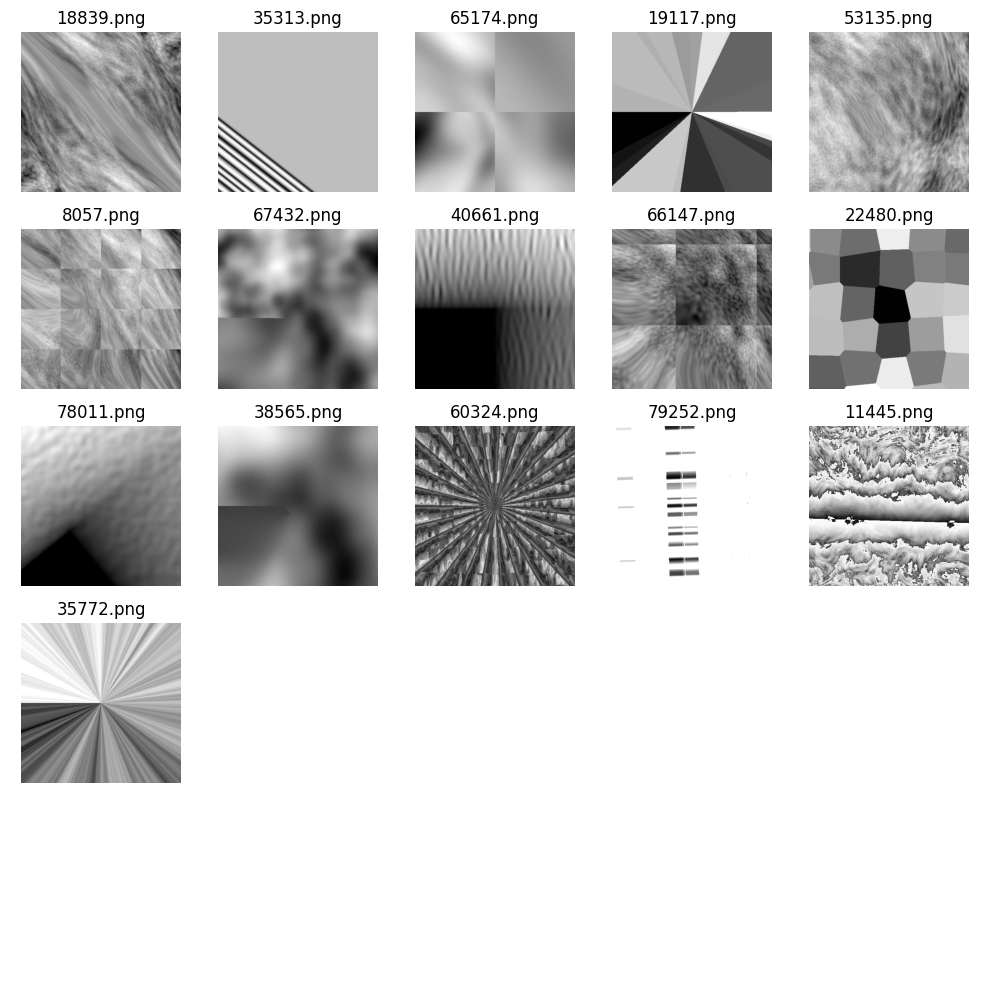

In [341]:
label = 1
print(colors[label])
cluster = clusters_dict[label]
images = list(np.random.choice(cluster, min(len(cluster), 16), replace=False))
show_image_grid(images)

# comparing to real images

In [266]:

def embed_new_images(model, folder_path, device):
    embeddings = {}
    for img_name in os.listdir(folder_path):
        if img_name.endswith('.png') or img_name.endswith('.jpg'):
            img_path = os.path.join(folder_path, img_name)
            embedding = get_image_embedding(model, img_path, device)
            embeddings[img_name] = embedding
    return embeddings

# Function to find the closest images based on cosine similarity
def find_closest_images(new_image_embeddings, original_image_embeddings, top_n=5):
    closest_images = {}
    
    for new_img_name, new_embedding in new_image_embeddings.items():
        similarities = cosine_similarity([new_embedding], list(original_image_embeddings.values()))
        closest_idx = np.argsort(similarities[0])[::-1][:top_n]  # Get top_n closest indexes
        closest_images[new_img_name] = [(list(original_image_embeddings.keys())[i], similarities[0][i]) for i in closest_idx]
    
    return closest_images

# Function to display the new image with the closest matches
def display_matches(new_img_name, new_img_path, closest_images):
    # Display the new image
    new_img = Image.open(new_img_path).convert("L")
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 6, 1)
    plt.imshow(new_img, cmap="gray")
    plt.title(f"New Image: {new_img_name}")
    plt.axis('off')
    
    # Display the closest images
    for idx, (closest_img_path, sim) in enumerate(closest_images):
        closest_img = Image.open(closest_img_path).convert("L") 
        plt.subplot(1, 6, idx + 2)
        plt.imshow(closest_img, cmap="gray")
        plt.title(f"Sim: {sim:.2f}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

In [250]:
new_image_folder = os.path.join(path, 'pintrest_images')

In [251]:
new_image_embeddings = embed_new_images(model, new_image_folder, device)

In [255]:
closest_images = find_closest_images(new_image_embeddings, name_to_emb, top_n=5)

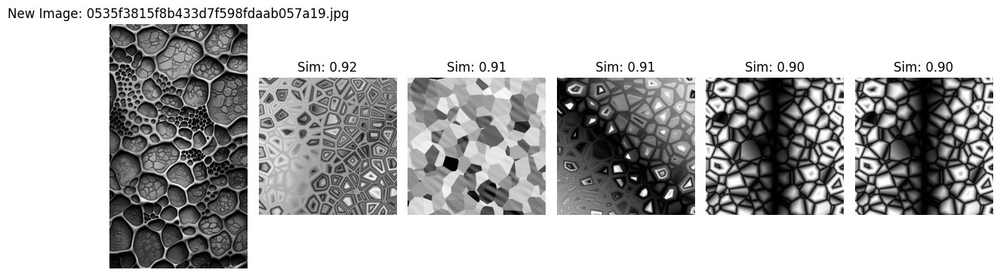

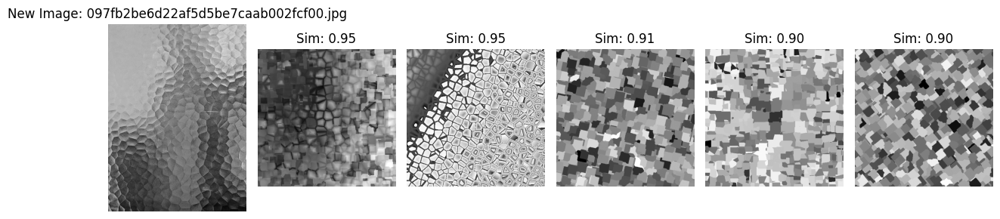

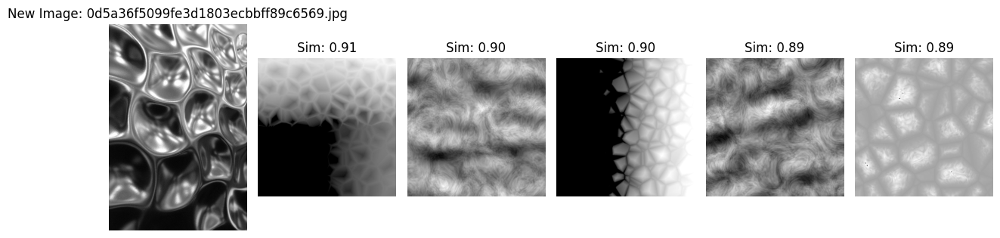

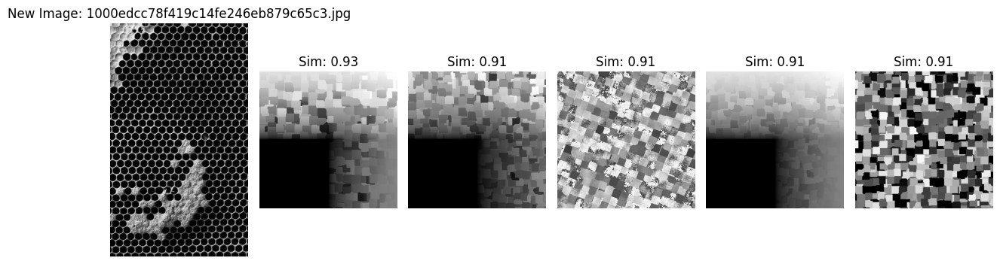

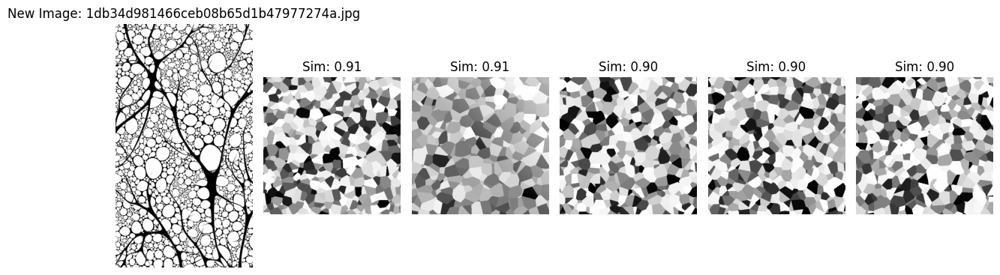

...

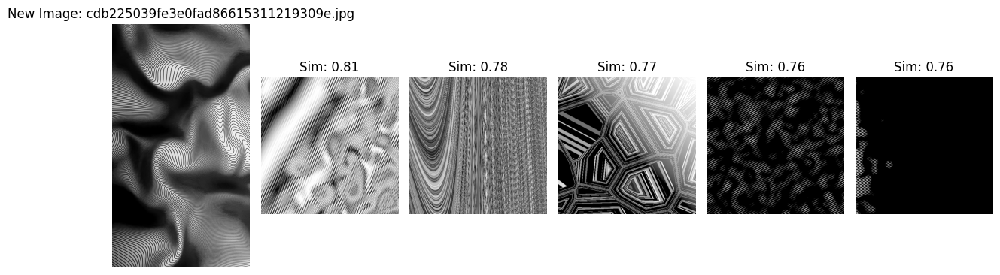

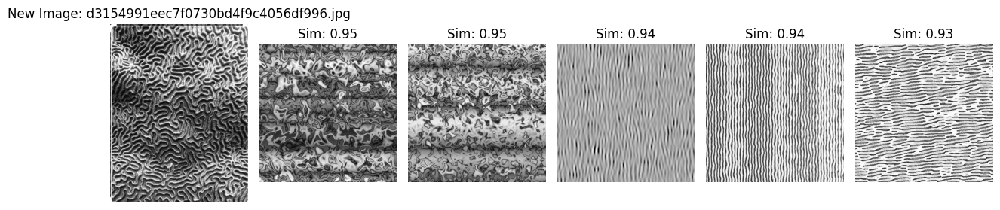

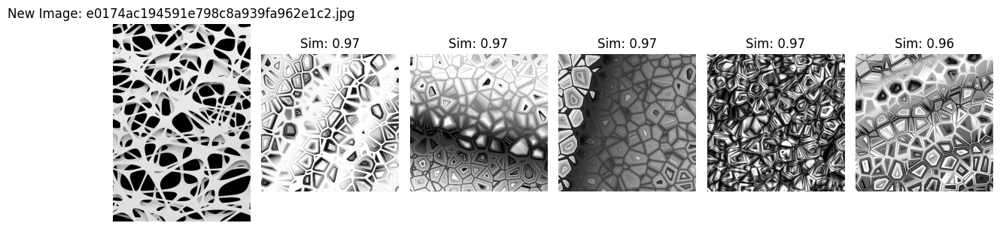

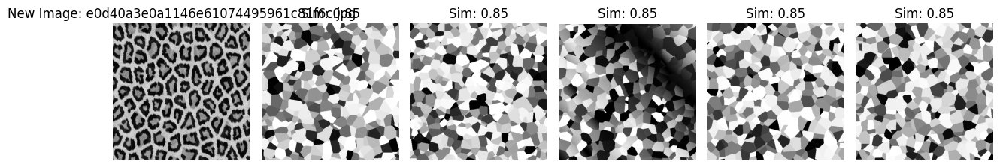

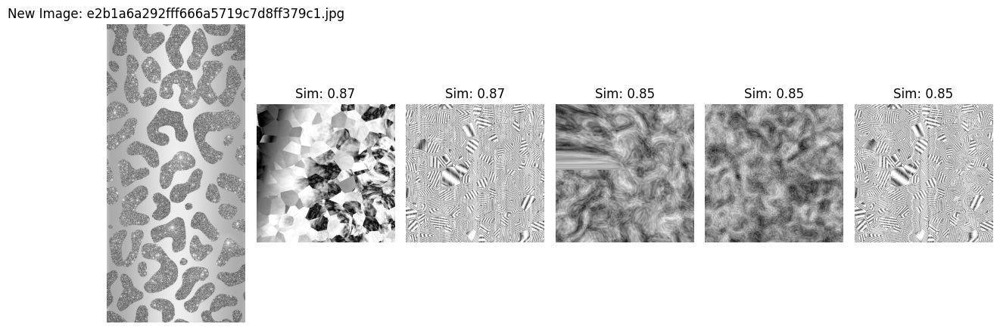

In [267]:
for new_img_name, closest in closest_images.items():
    new_img_path = os.path.join(new_image_folder, new_img_name)
    display_matches(new_img_name, new_img_path, closest)

# looking for a dataset with max variance

In [71]:
# Function to calculate pairwise cosine distances between embeddings and a given set of selected embeddings
def calculate_distances_to_selected(embeddings, selected_embeddings):
    # Convert selected embeddings into a list for cosine distance calculation
    selected_embedding_list = [embeddings[image] for image in selected_embeddings]
    all_embeddings = list(embeddings.values())
    
    sim_matrix = cosine_similarity(selected_embedding_list, all_embeddings)  # [n_selected, n_total]
    sim_to_selected = np.max(sim_matrix, axis=0)
    return sim_to_selected

# Function to iteratively select diverse images
def select_diverse_images(embeddings, sample_size):
    # Start with a random sample from the embeddings
    selected_images = random.sample(list(embeddings.keys()), 1)
    
    # Continue selecting until we reach the desired sample size
    while len(selected_images) < sample_size:
        # Calculate distances to the selected images
        sim_to_selected = calculate_distances_to_selected(embeddings, selected_images)
        
        # Select the image with the largest distance to the selected set
        max_distance_idx = np.argmin(sim_to_selected)
        selected_images.append(list(embeddings.keys())[max_distance_idx])
    
    return selected_images

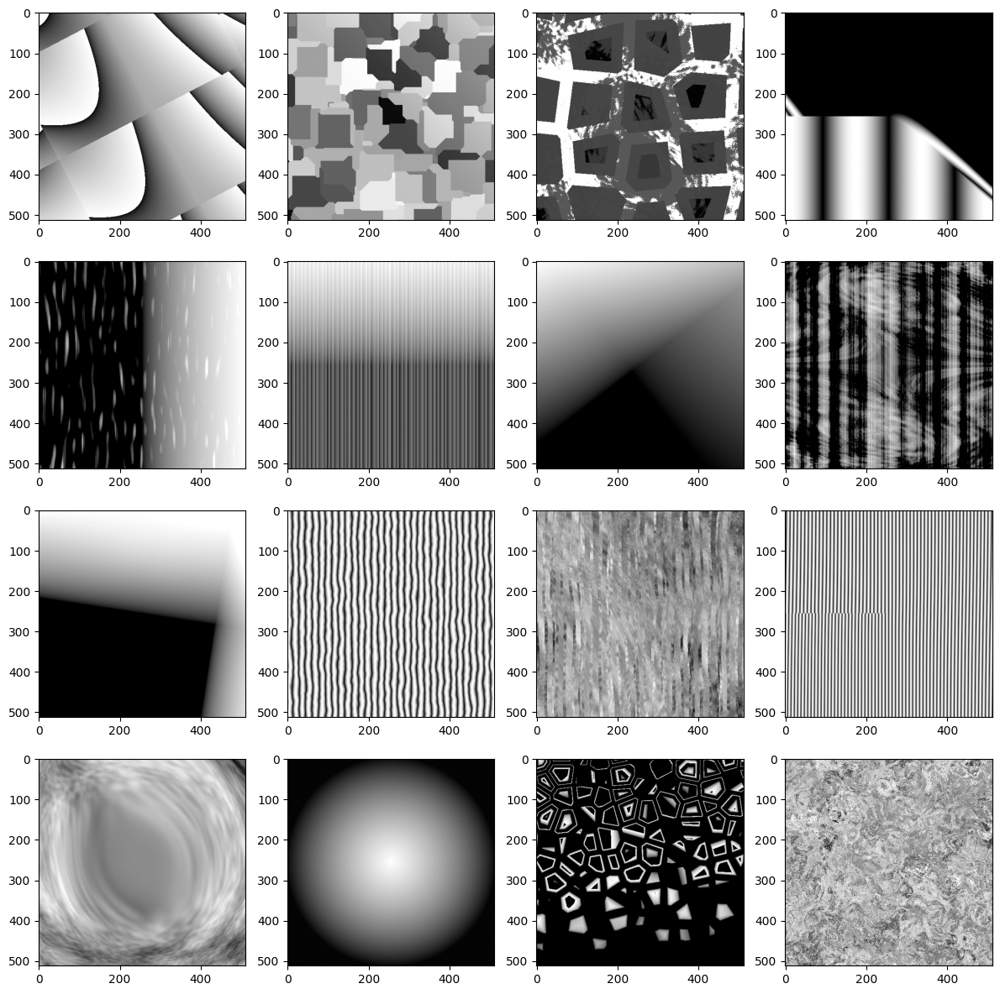

In [75]:
sample_size = 25
diverse_sample = select_diverse_images(name_to_emb, sample_size)
show_image_grid([(x, '') for x in diverse_sample])

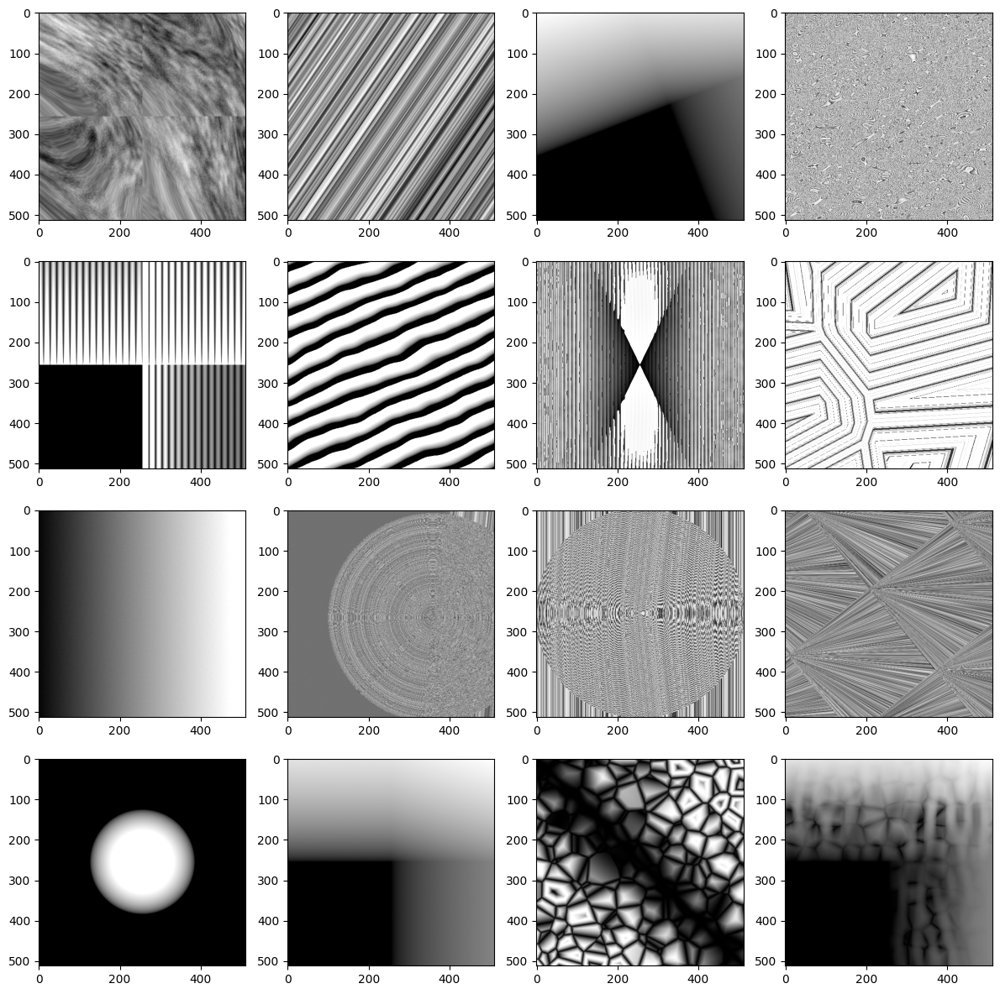

In [58]:
sample = np.random.choice(list(name_to_emb.keys()), sample_size)
show_image_grid([(x, '') for x in sample])